# Necessary Imports

In [75]:
import os
import cv2 as cv
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json
import shutil
import random
import requests
from PIL import Image
from pathlib import Path
import matplotlib.patches as patches
from shapely.geometry import Polygon, MultiPolygon
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from src.create_annotations import *
from skimage import morphology
from skimage.filters import threshold_otsu
from skimage.transform import rotate
from skimage import exposure
from skimage.filters import unsharp_mask
from skimage.restoration import denoise_tv_chambolle
from skimage.transform import resize


# Data Input

In [76]:
import os

Dataset_path = 'Dataset1.0'
images_path = os.path.join(Dataset_path, 'Input/Images')
bmasks_path = os.path.join(Dataset_path, 'Input/Bmasks')

# Create the directories if they don't exist
os.makedirs(images_path, exist_ok=True)
os.makedirs(bmasks_path, exist_ok=True)



In [77]:
# Dataset1.0 path
Dataset_path = "Dataset1.0/"

# Paths for images and masks
images_path = os.path.join(Dataset_path, "Input/Images")
masks_path = os.path.join(Dataset_path, "Input/Bmasks")

# Get list of files
images_files = os.listdir(images_path)
masks_files = os.listdir(masks_path)

# Create dataframes
images_df = pd.DataFrame({"image": images_files})
masks_df = pd.DataFrame({"mask": masks_files})

# Print sizes and heads
print("Images size:", len(images_df))
print("Masks size:", len(masks_df))

print("\nImages head:")
print(images_df.head(10))

print("\nMasks head:")
print(masks_df.head(10))


Images size: 50
Masks size: 50

Images head:
              image
0  ISIC_0024306.jpg
1  ISIC_0024307.jpg
2  ISIC_0024308.jpg
3  ISIC_0024309.jpg
4  ISIC_0024310.jpg
5  ISIC_0024311.jpg
6  ISIC_0024312.jpg
7  ISIC_0024313.jpg
8  ISIC_0024314.jpg
9  ISIC_0024315.jpg

Masks head:
                            mask
0  ISIC_0024306_segmentation.png
1  ISIC_0024307_segmentation.png
2  ISIC_0024308_segmentation.png
3  ISIC_0024309_segmentation.png
4  ISIC_0024310_segmentation.png
5  ISIC_0024311_segmentation.png
6  ISIC_0024312_segmentation.png
7  ISIC_0024313_segmentation.png
8  ISIC_0024314_segmentation.png
9  ISIC_0024315_segmentation.png


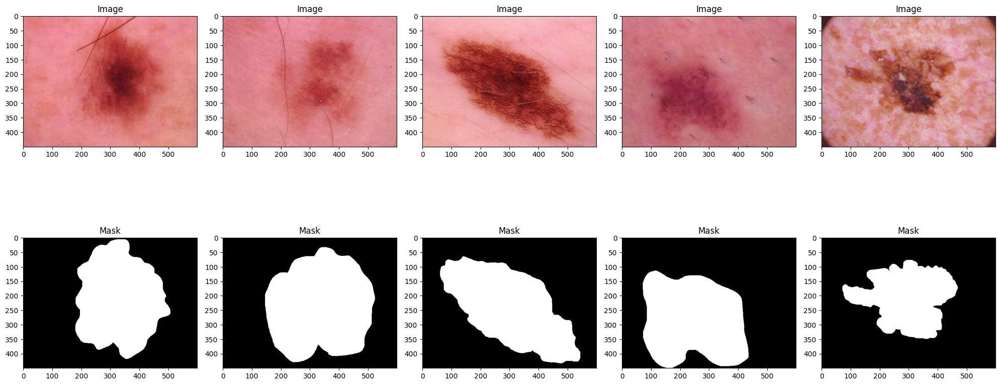

In [78]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Display 5 images and their masks
fig, axs = plt.subplots(2, 5, figsize=(20, 10))

for i in range(5):
    # Load image
    image_name = images_df.iloc[i]["image"]
    image_path = os.path.join(images_path, image_name)
    image = mpimg.imread(image_path)

    # Load mask
    mask_name = image_name.replace(".jpg", "_segmentation.png")
    mask_path = os.path.join(masks_path, mask_name)
    mask = mpimg.imread(mask_path)

    # Display image and mask
    axs[0, i].imshow(image)
    axs[0, i].axis('on')
    axs[0, i].set_title("Image")

    axs[1, i].imshow(mask, cmap='gray')
    axs[1, i].axis('on')
    axs[1, i].set_title("Mask")

plt.tight_layout()
plt.show()


# Resizing

In [79]:
# Resize images and masks to 416x416
new_size = (416, 416)

resized_images = []
resized_masks = []
image_filenames = []
mask_filenames = []

for i in range(len(images_df)):
    # Load image
    image_name = images_df.iloc[i]["image"]
    image_path = os.path.join(images_path, image_name)
    image = cv.imread(image_path)

    # Load mask
    mask_name = image_name.replace(".jpg", "_segmentation.png")
    mask_path = os.path.join(masks_path, mask_name)
    mask = cv.imread(mask_path, cv.IMREAD_GRAYSCALE)

    # Resize image
    resized_image = cv.resize(image, new_size, interpolation=cv.INTER_LINEAR)

    # Resize mask
    resized_mask = cv.resize(mask, new_size, interpolation=cv.INTER_NEAREST)

    # Store resized images and masks
    resized_images.append(resized_image)
    resized_masks.append(resized_mask)

    # Store original filenames
    image_filenames.append(image_name)
    mask_filenames.append(mask_name)

# Convert resized images and masks to numpy arrays
resized_images = np.array(resized_images)
resized_masks = np.array(resized_masks)

print("Resized images shape:", resized_images.shape)
print("Resized masks shape:", resized_masks.shape)


Resized images shape: (50, 416, 416, 3)
Resized masks shape: (50, 416, 416)


In [80]:

# Define the paths
image_dir = "Dataset1.0/Input/ResizedImg/resize_image/"
mask_dir = "Dataset1.0/Input/ResizedImg/resize_image_mask/"

# Create directories if they don't exist
os.makedirs(image_dir, exist_ok=True)
os.makedirs(mask_dir, exist_ok=True)


image_dir = "Dataset1.0/Input/ResizedImg/resize_image/"
mask_dir = "Dataset1.0/Input/ResizedImg/resize_image_mask/"
# Save resized images
for i in range(len(resized_images)):
    image_filename = image_filenames[i]
    mask_filename = mask_filenames[i]
    
    # Save resized image
    resized_image = Image.fromarray(resized_images[i])
    resized_image.save(os.path.join(image_dir, image_filename))

    # Save resized mask
    resized_mask = Image.fromarray(resized_masks[i])
    resized_mask.save(os.path.join(mask_dir, mask_filename))


In [81]:
def swap_rgb(image):
    return image[:, :, ::-1]

In [82]:
def RGBimshow(img):
  img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
  plt.imshow(img)

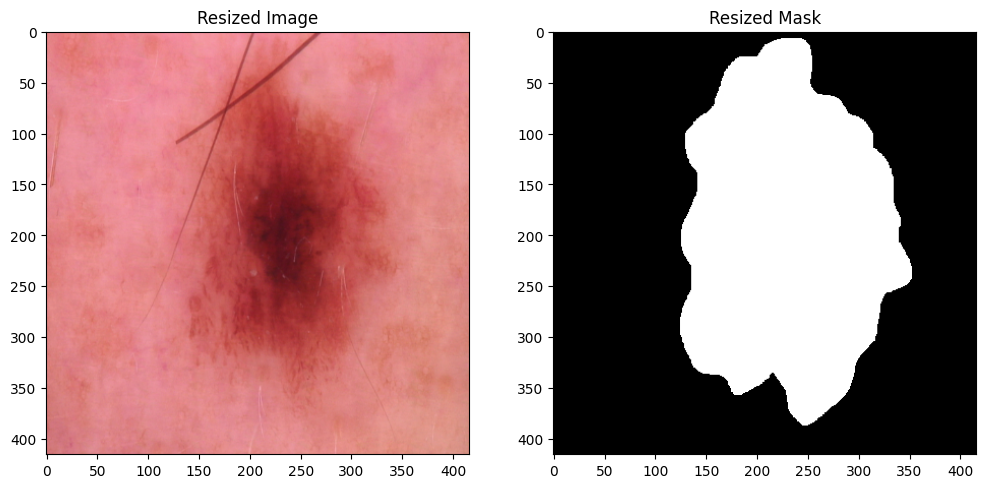

In [83]:

index = 0

# Plot the resized image and its mask
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot resized image
axs[0].imshow(swap_rgb(resized_images[index]))
axs[0].axis('on')
axs[0].set_title('Resized Image')

# Plot resized mask
axs[1].imshow(resized_masks[index], cmap='gray')
axs[1].axis('on')
axs[1].set_title('Resized Mask')

plt.show()

In [25]:
# Get the new width and height
new_height, new_width = resized_images[index].shape[:2]

# Print the new size
print(f"Resized Image Size - Width: {new_width}, Height: {new_height}")


Resized Image Size - Width: 416, Height: 416


# Coco Json Creation

In [84]:
# Label ids of the Dataset
category_ids = {
    "non": 0,
    "affected": 1,
}


category_colors = {
    "(0, 0, 0)": 0, # normal
    "(255, 255, 255)": 1, # affected
}

# Define the ids that are a multipolygon.
multipolygon_ids = [1]

In [85]:
# Get "images" and "annotations" info
def images_annotations_info(maskpath):
    # This id will be automatically increased as we go
    annotation_id = 0
    image_id = 0
    annotations = []
    images = []
    
    for mask_image in glob.glob(maskpath + "*.png"):
        # The mask image is *.png but the original image is *.jpg.

        original_file_name = os.path.basename(mask_image).split("_segmentation.")[0] + ".jpg"

        # Open the image and (to be sure) we convert it to RGB
        mask_image_open = Image.open(mask_image).convert("RGB")
        w, h = mask_image_open.size
        
        # "images" info 
        image = create_image_annotation(original_file_name, w, h, image_id)
        images.append(image)

        sub_masks = create_sub_masks(mask_image_open, w, h)
        has_class_1 = False
        for color, sub_mask in sub_masks.items():
            category_id = category_colors[color]

            # "annotations" info
            polygons, segmentations = create_sub_mask_annotation(sub_mask)

            # Check if we have classes that are a multipolygon
            if category_id in multipolygon_ids:
                # Combine the polygons to calculate the bounding box and area
                multi_poly = MultiPolygon(polygons)
                                
                annotation = create_annotation_format(multi_poly, segmentations, image_id, category_id, annotation_id)

                annotations.append(annotation)
                annotation_id += 1
            else:
                for i in range(len(polygons)):
                    # Cleaner to recalculate this variable
                    segmentation = [np.array(polygons[i].exterior.coords).ravel().tolist()]
                    
                    annotation = create_annotation_format(polygons[i], segmentation, image_id, category_id, annotation_id)
                    
                    annotations.append(annotation)
                    annotation_id += 1
                    if category_id == 1:
                        has_class_1 = True
        if not has_class_1:
            # Add a background annotation for the entire image
            annotation = create_annotation_format(Polygon([(0, 0), (w, 0), (w, h), (0, h)]), [[0, 0, w, 0, w, h, 0, h]], image_id, 0, annotation_id)
            annotations.append(annotation)
            annotation_id += 1

        image_id += 1
    return images, annotations, annotation_id



In [28]:
if __name__ == "__main__":
    # Get the standard COCO JSON format
    coco_format = get_coco_json_format()
    
    for keyword in ["resize_image"]:
        mask_path = "Dataset1.0/Input/ResizedImg/{}_mask/".format(keyword)
        
        # Create category section
        coco_format["categories"] = create_category_annotation(category_ids)
    
        # Create images and annotations sections
        coco_format["images"], coco_format["annotations"], annotation_cnt = images_annotations_info(mask_path)

        output_dir = "Dataset1.0/Output/CocoJsonMask"
        os.makedirs(output_dir, exist_ok=True)  # Create the output directory if it doesn't exist

        with open(os.path.join(output_dir, "{}.json".format(keyword)), "w") as outfile:
            json.dump(coco_format, outfile)

        print("Created %d annotations for images in folder: %s" % (annotation_cnt, mask_path))


Created 196 annotations for images in folder: Dataset1.0/Input/ResizedImg/resize_image_mask/


# Plotting the Resized images with coco json masking 

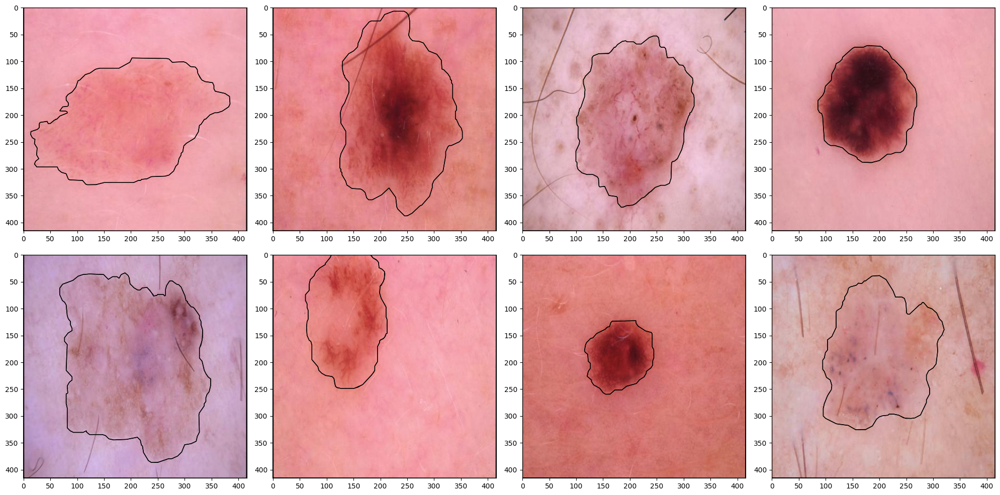

In [86]:
def display_images_with_coco_annotations(image_paths, annotations, display_type='both', colors=None):
    # Create a 2x4 grid of subplots for displaying images
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    
    for ax_row, row_images in zip(axs, image_paths):
        for ax, img_path in zip(ax_row, row_images):
            # Load and convert the image to RGB
            image = cv.imread(img_path)
            
            ax.imshow(image)
            ax.axis('on')

            # Find the image ID for the current image path
            img_filename = os.path.basename(img_path)
            img_id = next(item['id'] for item in annotations['images'] if item["file_name"] == img_filename)
            
            # Get the annotations for the current image ID
            img_annotations = [ann for ann in annotations['annotations'] if ann['image_id'] == img_id]
            
            # Iterate over each annotation and display bounding boxes or segmentations
            for ann in img_annotations:
                if display_type in ['bbox', 'both']:
                    bbox = ann['bbox']
                    ax.add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='black', facecolor='none'))
                
                if display_type in ['seg', 'both']:
                    for seg in ann['segmentation']:
                        poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                        ax.add_patch(patches.Polygon(poly, closed=True, edgecolor='black', fill=False))
                        
    plt.tight_layout()
    plt.show()

# Load annotations from the JSON file
with open('Dataset1.0/Output/CocoJsonMask/resize_image.json', 'r') as f:
    annotations = json.load(f)

# Select 8 random image files
image_dir = "Dataset1.0/Input/ResizedImg/resize_image"
image_files = random.sample([os.path.join(image_dir, img['file_name']) for img in annotations['images']], 8)

# Reshape the list of image files into a 2x4 grid
image_files = [image_files[i:i+4] for i in range(0, len(image_files), 4)]

# Display images with COCO annotations
display_images_with_coco_annotations(image_files, annotations, 'seg')


# Pre Processing


In [31]:
# Create the output directory if it doesn't exist
output_dir = 'Dataset1.0/Output/Processed/hairRemoved'
output_dir2 = 'Dataset1.0/Output/Processed/finalProcessed'
os.makedirs(output_dir, exist_ok=True)
os.makedirs(output_dir2, exist_ok=True)

In [87]:
image_list = []
for filename in glob.glob('Dataset1.0/Input/ResizedImg/resize_image/*.jpg') + glob.glob('Dataset1.0/Input/ResizedImg/resize_image/*.png'):  # Assuming images are in JPG format
    im = Image.open(filename)
    image_list.append(im)
len(image_list) 

50

In [88]:
def image_color(image):
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    return image_rgb

In [89]:

def deskew(image):
    # Convert image to grayscale
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    # Apply Otsu's thresholding
    _, binary = cv.threshold(gray, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)

    # Find contours
    contours, _ = cv.findContours(binary, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    # Find the largest contour
    contour = max(contours, key=cv.contourArea)

    # Get the minimum bounding rectangle of the contour
    rect = cv.minAreaRect(contour)
    angle = rect[2]

    # Rotate the image to correct skew
    if angle < -45:
        angle += 90
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv.warpAffine(image, M, (w, h), flags=cv.INTER_CUBIC, borderMode=cv.BORDER_REPLICATE)
    
    # Convert the rotated image back to RGB
    # rotated_rgb = cv.cvtColor(rotated, cv.COLOR_BGR2RGB)
    
    return image_color(rotated)



In [36]:
def scale_image(image, size=(416, 416)):
    return cv.resize(image, size)

In [37]:
def remove_noise(image):
    return cv.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)

In [38]:
def thin_skeletonize(image):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    _, binary_image = cv.threshold(gray_image, 127, 255, cv.THRESH_BINARY_INV)
    skeletonized_image = morphology.skeletonize(binary_image / 255)
    return cv.cvtColor(skeletonized_image.astype(np.uint8) * 255, cv.COLOR_GRAY2BGR)


In [40]:
def binarize_image(image):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    threshold_value = threshold_otsu(gray_image)
    return gray_image > threshold_value


In [42]:

def sharpen_image(image):
    # Create a sharpening kernel
    kernel = np.array([[-1, -1, -1],
                        [-1,  9, -1],
                        [-1, -1, -1]])

    # Apply the kernel to the image
    sharpened = cv.filter2D(image, -1, kernel)

    return image_color(sharpened)


In [43]:
def enhance_contrast(image):
    p2, p98 = np.percentile(image, (2, 98))
    return image_color(exposure.rescale_intensity(image, in_range=(p2, p98)))

In [44]:
def super_resolution(image):
    # Use linear interpolation to upscale the image
    upscaled_image = cv.resize(image, (image.shape[0]*4, image.shape[1]*2), interpolation=cv.INTER_LINEAR)
    return upscaled_image

In [46]:

def smooth_image(image, sigma=4.5):
    """
    Apply Gaussian blur to the image to make it smoother.

    Args:
    - image: Input image (numpy array).
    - sigma: Standard deviation of the Gaussian kernel.

    Returns:
    - Smoothed image (numpy array).
    """
    return image_color(cv.GaussianBlur(image, (0, 0), sigma))


In [47]:
def denoise_image(image):
    return denoise_tv_chambolle(image, weight=5)  # Adjust weight as needed


In [48]:
def color_correction(image):
    # Convert the image to LAB color space
    lab = cv.cvtColor(image, cv.COLOR_BGR2LAB)
    
    # Split the LAB image into L, A, and B channels
    l, a, b = cv.split(lab)
    
    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to the L channel
    clahe = cv.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    
    # Merge the CLAHE-enhanced L channel with the original A and B channels
    merged = cv.merge((cl, a, b))
    
    # Convert the merged LAB image back to BGR color space
    corrected = cv.cvtColor(merged, cv.COLOR_LAB2BGR)
    
    return image_color(corrected)
    

In [49]:
def fill_line(x, y, step=1):
    points = []
    if x[0] == x[1]:
        ys = np.arange(y.min(), y.max(), step)
        xs = np.repeat(x[0], ys.size)
    else:
        m = (y[1] - y[0]) / (x[1] - x[0])
        xs = np.arange(x[0], x[1], step * np.sign(x[1] - x[0]))
        ys = y[0] + m * (xs - x[0])
    return xs.astype(int), ys.astype(int)


In [50]:
def fill_image(img_masked, i_inds, j_inds, interp_win=10):
    for i, j in zip(i_inds, j_inds):
        if (i >= interp_win) or (j >= interp_win):
            template = img_masked[i: i + 2 * interp_win, j: j + 2 * interp_win].flatten()
        elif (img_masked.shape[0] - i < interp_win) or (img_masked.shape[1] - j < interp_win):
            template = img_masked[i - 2 * interp_win: i, j - 2 * interp_win: j].flatten()
        else:
            template = img_masked[i - interp_win: i + interp_win, j - interp_win: j + interp_win].flatten()

        template = np.delete(template, (template < 0))
        img_masked[i, j] = np.median(template)
    return img_masked

In [162]:
def remove_hair(images, cfg=None):
    num_images = len(images)
    if cfg is None:
        class CFG():
            def __init__(self):
                self.edge_low_threshold = 100 # edge high threshold in Canny algorithm
                self.edge_high_threshold = 220 # edge high threshold in Canny algorithm

                self.dark_spot_threshold = 150 # pixels brighter than this are ignored

                self.linelength_threshold = 10 # lines shorter than this are ignored

                self.divergence_threshold = 0.25 # Should be farther away from image center than this threshold to be considered hair
                self.patchiness_threshold = 0.15 # Should be more widespread than this threshold to be considered hair

                self.interp_win = 20
        cfg = CFG()
        

    fig, ax = plt.subplots(num_images, 6, figsize=(12, 2 * num_images))
    plt.subplots_adjust(wspace=0.01, hspace=0.2)
    for this_ax in ax.ravel():
        this_ax.set_axis_off()
    
    img_filtered_all = []
    for image_ind, img_orig in enumerate(images):
        image_size = img_orig.shape[:2]

        # -------------------------------------------------------- Check if input is RGB
        plt.sca(ax[image_ind, 0])
        
        if img_orig.ndim == 3:
            RGB_input = 1
            img = img_orig.mean(-1)
        else:
            RGB_input = 0
            img = img_orig.copy()
        img_rgb = cv.cvtColor(img_orig, cv.COLOR_BGR2RGB)     
        plt.imshow(img_rgb, cmap='gray')
        plt.title('Original')
        
        skip_flag = 0
    
        # -------------------------------------------------------- The Edges
        plt.sca(ax[image_ind, 1])

        kernel = np.ones((3,3),np.uint8)
        img_filt = cv.morphologyEx(np.uint8(img), cv.MORPH_BLACKHAT, kernel) 
        img_filt = np.where(img_filt > 15, img_filt, 0)
        
        kernel = np.ones((4,4),np.uint8)
        img_filt = cv.morphologyEx(img_filt, cv.MORPH_DILATE, kernel)
        
        plt.imshow(img_filt, cmap='gray')
        plt.title('BlackHat')
        
        # -------------------------------------------------------- Edges within dark spots of image
        plt.sca(ax[image_ind, 2])
        
        dark_spots = (img < cfg.dark_spot_threshold).astype(np.uint8)
        kernel = np.ones((4,4),np.uint8)
        dark_spots = cv.morphologyEx(dark_spots, cv.MORPH_DILATE, kernel)
        
        img_filt = img_filt * dark_spots

        plt.imshow(img_filt, cmap='gray')
        plt.title('Only darker pixels')
    
        # -------------------------------------------------------- The Lines detected from the Edges
        plt.sca(ax[image_ind, 3])
        
        lines = cv.HoughLinesP(img_filt, cv.HOUGH_PROBABILISTIC, np.pi / 90, 20, None, 1, 20)

        if lines is not None:
            lines = lines.reshape(-1, 4)
            N_lines = lines.shape[0]

            # exclude short lines
            lines_to_interp = []
            for ind in range(N_lines):
                line = lines[ind, :]
                x, y = fill_line(line[0::2], line[1::2], 1)
                line_length = np.sqrt((line[0] - line[2])**2 + (line[1] - line[3])**2)

                if (line_length < cfg.linelength_threshold):
                    plt.scatter(x, y, 30, alpha=0.1, c='green')
                else:
                    plt.scatter(x, y, 1, alpha=0.5, c='red')
                    lines_to_interp.append( (x, y) )
                
        else:
            skip_flag = 1
            img_filt = np.zeros(image_size)

        plt.imshow(img_filt, cmap='gray')
        plt.title('Long lines')

                
        # -------------------------------------------------------- The Final mask (from only reasonably longer lines)
        plt.sca(ax[image_ind, 4])
        
        if skip_flag == 1:
            Mask = np.zeros(image_size)
            
        else:
            Mask = np.zeros_like(img_filt)
            for (x, y) in lines_to_interp:
                Mask[y, x] = 1

            kernel = np.ones((3,3),np.uint8)
            Mask = cv.morphologyEx(Mask, cv.MORPH_DILATE, kernel)
            Mask = Mask.astype(float)
            Mask_i_inds, Mask_j_inds = np.where(Mask)    

            # -------- Check if it is patchy enough (otherwise it's false positives; because hair is likely patchy)
            i, j = np.where( Mask != 0 )

            if i.size == 0:
                skip_flag = 1
                Mask = np.zeros(image_size)

            else:
                x_patchinees = np.std(j) / Mask.shape[1]
                y_patchinees = np.std(i) / Mask.shape[0]
                x_divergence = np.abs(0.5 - np.mean(i) / Mask.shape[0])
                y_divergence = np.abs(0.5 - np.mean(j) / Mask.shape[1])
                patchiness = np.sqrt( x_patchinees * y_patchinees )
                divergence = np.max([x_divergence, y_divergence])
                
                if (divergence < cfg.divergence_threshold) and (patchiness < cfg.patchiness_threshold):
                    skip_flag = 1
                    Mask = np.zeros(image_size)

        plt.imshow(Mask, cmap='gray')
        plt.title('Final mask')

    
        # -------------------------------------------------------- Interpolate the hairs
        plt.sca(ax[image_ind, 5])
        if skip_flag:
            img_filtered = img_orig
            
        else:
            Mask_temp = 1 - 2 * Mask # Positive if area is good, Negative if area is bad    
            img_filtered = img_orig.copy()
            if RGB_input:
                for channel in range( img_orig.shape[-1] ):
                    img_masked = np.squeeze(img_orig[:,:,channel]) * Mask_temp
                    img_filtered[:, :, channel] = fill_image(img_masked, Mask_i_inds, Mask_j_inds, interp_win=cfg.interp_win)
            else:
                img_masked = img_orig * Mask_temp  
                img_filtered = fill_image(img_masked, Mask_i_inds, Mask_j_inds)
        
        img_rgb = cv.cvtColor(img_filtered, cv.COLOR_BGR2RGB)     
        plt.imshow(img_rgb, cmap='gray')
        plt.title('Filtered')
        img_filtered_all.append(img_filtered)
        
    return img_filtered_all


d:\FinalYearProj_KMRT1S2\myenv\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\FinalYearProj_KMRT1S2\myenv\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\SUVROJIT\AppData\Local\Temp\ipykernel_17160\882763302.py:149: RuntimeWarning: invalid value encountered in cast
  img_filtered[:, :, channel] = fill_image(img_masked, Mask_i_inds, Mask_j_inds, interp_win=cfg.interp_win)


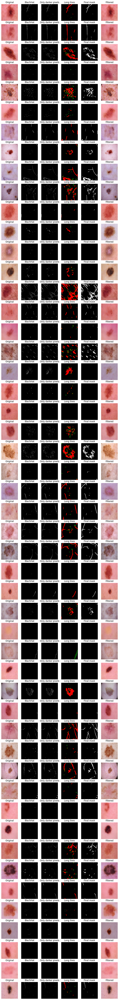

In [90]:
data_path = 'Dataset1.0/Input/ResizedImg/resize_image'
output_path = 'Dataset1.0/Output/Processed/hairRemoved'

# Ensure output directory exists
os.makedirs(output_path, exist_ok=True)

# Assuming `data_path` is the path to your single directory containing all images
images = []
file_names = []
for file_name in os.listdir(data_path):
    file_path = os.path.join(data_path, file_name)
    img = cv.imread(file_path)
    
    # Swap the red and blue channels
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    
    images.append(img)
    file_names.append(file_name)

# Remove hair from images
images_no_hair = remove_hair(images)

# Save processed images
for idx, (img, file_name) in enumerate(zip(images_no_hair, file_names)):
    output_file_path = os.path.join(output_path, file_name)
    cv.imwrite(output_file_path, img)


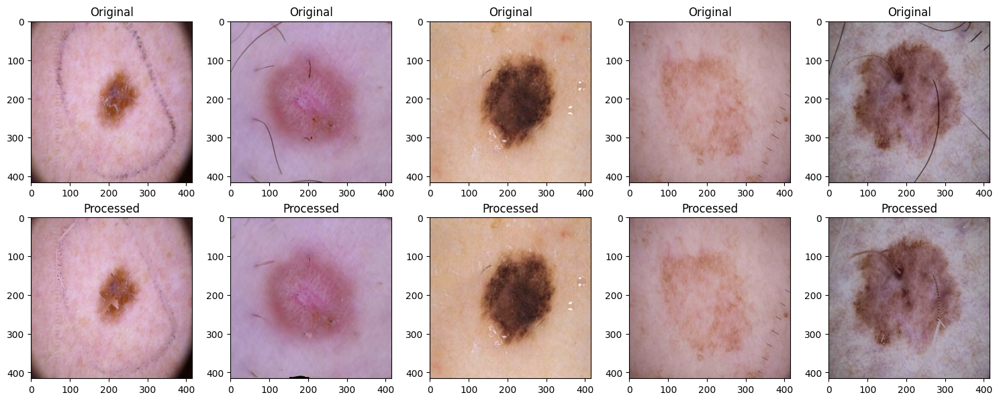

In [53]:
# Display some processed images
plt.figure(figsize=(15, 6))
indices = random.sample(range(len(images)), 5)
for i, index in enumerate(indices):
    plt.subplot(2, 5, i + 1)
    plt.imshow(cv.cvtColor(images[index], cv.COLOR_BGR2RGB))
    plt.axis('on')
    plt.title('Original')
    plt.subplot(2, 5, i + 6)
    plt.imshow(cv.cvtColor(images_no_hair[index], cv.COLOR_BGR2RGB))
    plt.axis('on')
    plt.title('Processed')
plt.tight_layout()
plt.show()


# Processing

In [91]:
import glob
from PIL import Image
original_image_path = 'Dataset1.0/Output/Processed/hairRemoved/'

image_list2 = []
for filename in glob.glob('Dataset1.0/Output/Processed/hairRemoved/*.jpg') + glob.glob('Dataset1.0/Output/Processed/hairRemoved/*.png'):
    im = Image.open(filename)
    image_list2.append(im)

len(image_list2)


50

In [92]:
def save_processed_image(processed_image, output_dir, filename):
    output_filename = os.path.join(output_dir, os.path.basename(filename))
    cv.imwrite(output_filename, processed_image.astype(np.uint8))


In [39]:
# def save_images(image_list, output_dir):
#     # Iterate over the image list
#     for idx, im in enumerate(image_list):
#         # Convert PIL image to OpenCV format
#         cv_image = np.array(im)

#         # Skew Correction(please dont use makes the surrounding hazy(suv))
#         # deskewed_image = deskew(cv_image)
#         # save_processed_image(deskewed_image, output_dir, idx)

#         # Image Scaling(use not recomended makes the img small out of our ratio(suv))
#         # scaled_image = scale_image(cv_image)
#         # save_processed_image(scaled_image, output_dir, idx)
       
#         # Noise Removal(dont use takes a lot of time(suv))
#         # noise_removed_image = remove_noise(cv_image)
#         # save_processed_image(noise_removed_image, output_dir, idx)

#         # Thinning and Skeletonization
#         # skeletonized_image = thin_skeletonize(cv_image)
#         # save_processed_image(skeletonized_image, output_dir, idx)

#         color_correction_image = color_correction(cv_image)
#         save_processed_image(color_correction_image, output_dir, idx)
        
#         sharpened_image = sharpen_image(color_correction_image)
#         save_processed_image(sharpened_image, output_dir, idx)

#         enhance_contrast_image = enhance_contrast(sharpened_image)
#         save_processed_image(enhance_contrast_image, output_dir, idx)

#         super_resolution_image = super_resolution(enhance_contrast_image)
#         save_processed_image(super_resolution_image, output_dir, idx)

#         smoother_image = smooth_image(super_resolution_image)
#         save_processed_image(smoother_image, output_dir, idx)

#         #do not use (suv)
#         # denoised_image = denoise_image(cv_image)
#         # save_processed_image(denoised_image, output_dir, idx)

       
        

#     # Notify user that processing is complete
#     print("Image processing complete. Processed images saved in 'output/processed_images' directory.")


In [93]:
def save_images(image_list, output_dir, filenames):
    # Iterate over the image list
    for filename, im in zip(filenames, image_list):
        # Convert PIL image to OpenCV format
        cv_image = np.array(im)

        color_correction_image = color_correction(cv_image)
        save_processed_image(color_correction_image, output_dir, filename)
        
        sharpened_image = sharpen_image(color_correction_image)
        save_processed_image(sharpened_image, output_dir, filename)

        enhance_contrast_image = enhance_contrast(sharpened_image)
        save_processed_image(enhance_contrast_image, output_dir, filename)

        super_resolution_image = super_resolution(enhance_contrast_image)
        save_processed_image(super_resolution_image, output_dir, filename)

        smoother_image = smooth_image(super_resolution_image)
        save_processed_image(smoother_image, output_dir, filename)

    # Notify user that processing is complete
    print("Image processing complete. Processed images saved in 'output/processed_images' directory.")
output_dir = 'Dataset1.0/Output/Processed/finalProcessed'
filenames = [file_name for file_name in os.listdir(data_path)]
save_images(images_no_hair, output_dir, filenames)


Image processing complete. Processed images saved in 'output/processed_images' directory.


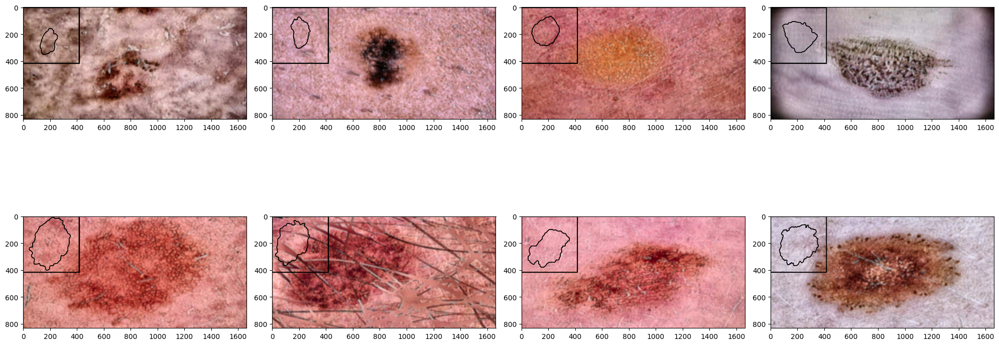

In [94]:
def display_images_with_coco_annotations(image_paths, annotations, display_type='both', colors=None):
    # Create a 2x4 grid of subplots for displaying images
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    
    for ax_row, row_images in zip(axs, image_paths):
       
        for ax, img_path in zip(ax_row, row_images):
           
            image = cv.cvtColor(cv.imread(img_path), cv.COLOR_BGR2RGB)
            ax.imshow(image)
            ax.axis('on')

            # Find the image ID for the current image path
            img_filename = os.path.basename(img_path)
            img_id = next(item['id'] for item in annotations['images'] if item["file_name"] == img_filename)
            
            # Get the annotations for the current image ID
            img_annotations = [ann for ann in annotations['annotations'] if ann['image_id'] == img_id]
            
            # Iterate over each annotation and display bounding boxes or segmentations
            for ann in img_annotations:
                if display_type in ['bbox', 'both']:
                    bbox = ann['bbox']
                    ax.add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='black', facecolor='none'))
                
                if display_type in ['seg', 'both']:
                    for seg in ann['segmentation']:
                        poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                        ax.add_patch(patches.Polygon(poly, closed=True, edgecolor='black', fill=False))
                        
    plt.tight_layout()
    plt.show()

# Load annotations from the JSON file
with open('Dataset1.0/Output/CocoJsonMask/resize_image.json', 'r') as f:
    annotations = json.load(f)

# Select 8 random image files
image_dir = "Dataset1.0/Output/Processed/finalProcessed"
image_files = random.sample([os.path.join(image_dir, img['file_name']) for img in annotations['images']], 8)

# Reshape the list of image files into a 2x4 grid
image_files = [image_files[i:i+4] for i in range(0, len(image_files), 4)]

# Display images with COCO annotations
display_images_with_coco_annotations(image_files, annotations, 'seg')


In [95]:
# Path to the directory
dir_path = "Dataset1.0/Output/Processed/finalProcessed"

# List all files in the directory
files = os.listdir(dir_path)

# Find the first image file
image_file = next((file for file in files if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))), None)

# If an image file is found, load it
if image_file:
    image_path = os.path.join(dir_path, image_file)
    image = Image.open(image_path)
    
    # Get the width and height of the image
    if image is not None:
        new_width, new_height = image.size
        print(f"Width: {new_width}, Height: {new_height}")
    else:
        print("Failed to load image.")
else:
    print("No image files found in the directory.")


Width: 1664, Height: 832


In [96]:

# Load the COCO JSON file
with open('Dataset1.0/Output/CocoJsonMask/resize_image.json', 'r') as f:
    coco_data = json.load(f)

# Access the annotations for the first image (assuming it's in the 'images' field)
image_info = coco_data['images'][0]

# Get the width and height of the image
original_width = image_info['width']
original_height = image_info['height']

print(f"Width: {original_width}, Height: {original_height}")


Width: 416, Height: 416


In [97]:
# Load and resize your processed images
output_path = 'Dataset1.0/Output/Processed/hairRemoved'
for idx, file_name in enumerate(os.listdir(output_path)):
    file_path = os.path.join(output_path, file_name)
    img = cv.imread(file_path)
    resized_img = cv.resize(img, (original_width, original_height))

    # Save the resized image
    cv.imwrite(file_path, resized_img)

In [98]:
# Load and resize your processed images
output_path = 'Dataset1.0/Output/Processed/finalProcessed'
for idx, file_name in enumerate(os.listdir(output_path)):
    file_path = os.path.join(output_path, file_name)
    img = cv.imread(file_path)
    resized_img = cv.resize(img, (original_width, original_height))

    # Save the resized image
    cv.imwrite(file_path, resized_img)

In [99]:
# Path to the directory
dir_path = "Dataset1.0/Output/Processed/finalProcessed"

# List all files in the directory
files = os.listdir(dir_path)

# Find the first image file
image_file = next((file for file in files if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))), None)

# If an image file is found, load it
if image_file:
    image_path = os.path.join(dir_path, image_file)
    image = Image.open(image_path)
    
    # Get the width and height of the image
    if image is not None:
        new_width, new_height = image.size
        print(f"Width: {new_width}, Height: {new_height}")
    else:
        print("Failed to load image.")
else:
    print("No image files found in the directory.")


Width: 416, Height: 416


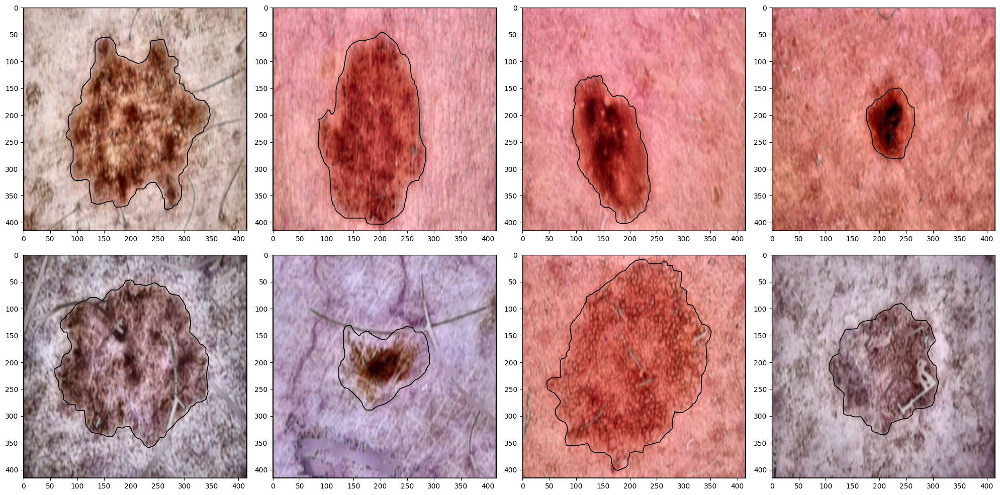

In [100]:
def display_images_with_coco_annotations(image_paths, annotations, display_type='both', colors=None):
    # Create a 2x4 grid of subplots for displaying images
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    
    for ax_row, row_images in zip(axs, image_paths):
       
        for ax, img_path in zip(ax_row, row_images):
           
            image = cv.cvtColor(cv.imread(img_path), cv.COLOR_BGR2RGB)
            ax.imshow(image)
            ax.axis('on')

            # Find the image ID for the current image path
            img_filename = os.path.basename(img_path)
            img_id = next(item['id'] for item in annotations['images'] if item["file_name"] == img_filename)
            
            # Get the annotations for the current image ID
            img_annotations = [ann for ann in annotations['annotations'] if ann['image_id'] == img_id]
            
            # Iterate over each annotation and display bounding boxes or segmentations
            for ann in img_annotations:
                if display_type in ['bbox', 'both']:
                    bbox = ann['bbox']
                    ax.add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='black', facecolor='none'))
                
                if display_type in ['seg', 'both']:
                    for seg in ann['segmentation']:
                        poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                        ax.add_patch(patches.Polygon(poly, closed=True, edgecolor='black', fill=False))
                        
    plt.tight_layout()
    plt.show()

# Load annotations from the JSON file
with open('Dataset1.0/Output/CocoJsonMask/resize_image.json', 'r') as f:
    annotations = json.load(f)

# Select 8 random image files
image_dir = "Dataset1.0/Output/Processed/finalProcessed"
image_files = random.sample([os.path.join(image_dir, img['file_name']) for img in annotations['images']], 8)

# Reshape the list of image files into a 2x4 grid
image_files = [image_files[i:i+4] for i in range(0, len(image_files), 4)]

# Display images with COCO annotations
display_images_with_coco_annotations(image_files, annotations, 'seg')


In [101]:
# Define the paths
processed_images_dir = "Dataset1.0/Output/Processed/finalProcessed/"
mask_dir = "Dataset1.0/Input/ResizedImg/resize_image_mask/"
initial_data_dir = "Data/Initial_data/"

os.makedirs(initial_data_dir, exist_ok=True)

# Iterate through processed images directory
for img_name in os.listdir(processed_images_dir):
    img_path = os.path.join(processed_images_dir, img_name)
    mask_name = img_name.replace(".jpg", "_segmentation.png")
    mask_path = os.path.join(mask_dir, mask_name)
    if os.path.exists(mask_path):
        # Copy image and mask to initial_data_dir
        shutil.copy(img_path, initial_data_dir)
        shutil.copy(mask_path, initial_data_dir)


In [102]:
from random import choice
import os
import shutil

# Setup directory names
initial_data_dir = 'Data/Initial_data/'
train_image_dir = 'Data/Image/train/'
val_image_dir = 'Data/Image/val/'
train_layers_dir = 'Data/Layers/train/'
val_layers_dir = 'Data/Layers/val/'

# Setup ratio
train_ratio = 0.8
val_ratio = 0.2

# Create directories if they don't exist
os.makedirs(train_image_dir, exist_ok=True)
os.makedirs(val_image_dir, exist_ok=True)
os.makedirs(train_layers_dir, exist_ok=True)
os.makedirs(val_layers_dir, exist_ok=True)

# Get a list of image files and mask files
image_files = [f for f in os.listdir(initial_data_dir) if f.endswith('.jpg')]
mask_files = [f for f in os.listdir(initial_data_dir) if f.endswith('_segmentation.png')]

# Counting images for train and val sets
count_for_train = int(len(image_files) * train_ratio)
count_for_val = int(len(image_files) * val_ratio)

# Cycle for the train directory
for _ in range(count_for_train):
    image_file = choice(image_files)  # Get a random image file
    mask_file = image_file.replace('.jpg', '_segmentation.png')  # Corresponding mask file

    # Move the files to the train directories if they exist
    if os.path.exists(os.path.join(initial_data_dir, mask_file)):
        shutil.move(os.path.join(initial_data_dir, image_file), os.path.join(train_image_dir, image_file))
        shutil.move(os.path.join(initial_data_dir, mask_file), os.path.join(train_layers_dir, mask_file))

        # Remove the files from the lists
        image_files.remove(image_file)
        mask_files.remove(mask_file)
    else:
        print(f"File not found: {mask_file}")

# Cycle for the val directory
for _ in range(count_for_val):
    image_file = choice(image_files)  # Get a random image file
    mask_file = image_file.replace('.jpg', '_segmentation.png')  # Corresponding mask file

    # Move the files to the val directories if they exist
    if os.path.exists(os.path.join(initial_data_dir, mask_file)):
        shutil.move(os.path.join(initial_data_dir, image_file), os.path.join(val_image_dir, image_file))
        shutil.move(os.path.join(initial_data_dir, mask_file), os.path.join(val_layers_dir, mask_file))

        # Remove the files from the lists
        image_files.remove(image_file)
        mask_files.remove(mask_file)
    else:
        print(f"File not found: {mask_file}")


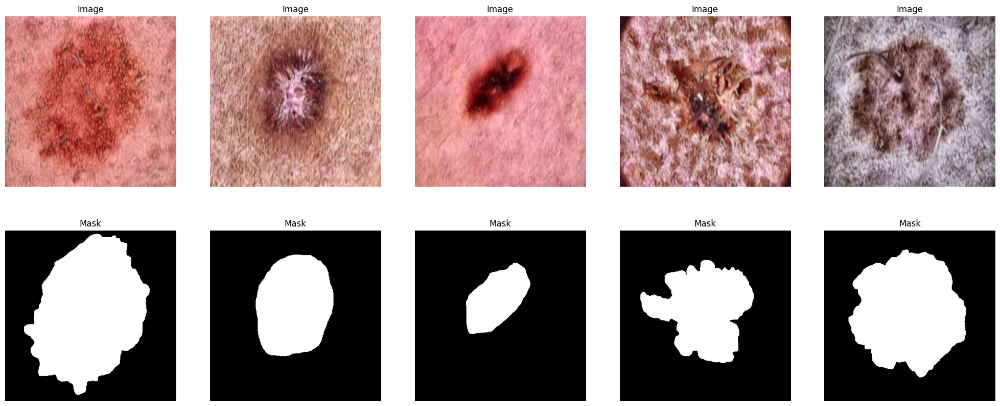

In [109]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Function to plot images and their corresponding masks in 5 columns
def plot_images_with_masks(images, masks):
    fig, axs = plt.subplots(2, 5, figsize=(25, 10))
    for i in range(5):
        axs[0, i].imshow(images[i])
        axs[0, i].axis('off')
        axs[0, i].set_title('Image')

        axs[1, i].imshow(masks[i], cmap='gray')
        axs[1, i].axis('off')
        axs[1, i].set_title('Mask')
    plt.show()

# Set the directories for images and masks
train_image_dir = 'Data/Image/train/'
train_layers_dir = 'Data/Layers/train/'

# Get list of image files
image_files = os.listdir(train_image_dir)
# Get list of mask files
mask_files = os.listdir(train_layers_dir)

# Choose 5 random indices
random_indices = random.sample(range(len(image_files)), 5)

# Load images and masks
images = [Image.open(os.path.join(train_image_dir, image_files[idx])) for idx in random_indices]
masks = [Image.open(os.path.join(train_layers_dir, image_files[idx].replace('.jpg', '_segmentation.png'))) for idx in random_indices]

# Plot the images with their masks in 5 columns
plot_images_with_masks(images, masks)


# Segmentation Using Attention U-Net

In [62]:

import pandas as pds
import numpy as np
import os
import matplotlib.pyplot as plt
import tensorflow
import tqdm
import skimage.io
import glob
from skimage.io import imread, imshow
from skimage.transform import resize
import PIL
from sklearn.utils import shuffle
import cv2
import matplotlib.patches as patches
import json

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, BatchNormalization, MaxPool2D, Dropout, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint


In [61]:
import pandas as pds
import numpy as np
import os
import matplotlib.pyplot as plt
import tensorflow
import tqdm
import skimage.io
import glob
from skimage.io import imread, imshow
from skimage.transform import resize
import PIL
from sklearn.utils import shuffle
import cv2
import matplotlib.patches as patches
import json

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, BatchNormalization, MaxPool2D, Dropout, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

%matplotlib inline

In [63]:
import cv2
# from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
from tensorflow.keras.layers import Concatenate, MaxPooling2D, Lambda,Input, MaxPool2D, Dense, BatchNormalization, LeakyReLU, Conv2D, UpSampling2D, Reshape, Flatten, Dropout
from tensorflow.keras.models import Model, Sequential
from keras import backend as K
from tensorflow.keras.layers import Convolution2DTranspose, UpSampling2D, Dropout, Conv2DTranspose
import tensorflow as tf
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras import backend as K

In [64]:
image_dir = 'Data/Image/train'
image_add = [os.path.join(image_dir, img) for img in os.listdir(image_dir)]


In [65]:
mask_img_list = os.listdir('Data/Layers/train')
df_mask_images = pds.DataFrame(mask_img_list, columns=['image_id'])

print('size: ', df_mask_images.size)
df_mask_images.head(10)

size:  40


,image_id
0,ISIC_0024306_segmentation.png
1,ISIC_0024307_segmentation.png
2,ISIC_0024308_segmentation.png
3,ISIC_0024309_segmentation.png
4,ISIC_0024310_segmentation.png
5,ISIC_0024311_segmentation.png
6,ISIC_0024312_segmentation.png
7,ISIC_0024314_segmentation.png
8,ISIC_0024315_segmentation.png
9,ISIC_0024316_segmentation.png


In [66]:
img_list = os.listdir('Data/Image/train')
df_images = pds.DataFrame(img_list, columns=['image_id'])

print('size: ', df_images.size)
df_images.head(10)

size:  40


,image_id
0,ISIC_0024306.jpg
1,ISIC_0024307.jpg
2,ISIC_0024308.jpg
3,ISIC_0024309.jpg
4,ISIC_0024310.jpg
5,ISIC_0024311.jpg
6,ISIC_0024312.jpg
7,ISIC_0024314.jpg
8,ISIC_0024315.jpg
9,ISIC_0024316.jpg


In [67]:
import cv2
import numpy as np
import glob

# Initialize empty lists to store images and masks
images = []
masks = []
not_found_imgs = []

# Paths to the image and mask directories
data_path = 'Data/Image/train/'
mask_path = 'Data/Layers/train/'

# Starting index for images
start_val = 24306

# Size of the dataset
size = start_val + 50
i = start_val

# Loop through the range of images
while i <= size:
    # Convert the index to a string and calculate the number of zeroes to prepend
    num = str(i)
    zeroes = 7 - len(num)

    # Load the binary mask for the current image
    mask_image = glob.glob(f"{mask_path}ISIC_{zeroes * '0'}{i}_segmentation.png")
    if mask_image:
        # The mask image is found
        mask_image = mask_image[0]
        mask = cv2.imread(mask_image)
        # Resize the mask to (128, 128)
        mask = cv2.resize(mask, (128, 128))
        masks.append(mask)
    else:
        # If mask is not found, add the image index to the not_found_imgs list
        not_found_imgs.append(i)

    # Load the image
    img_path = f"{data_path}ISIC_{zeroes * '0'}{i}.jpg"
    img = cv2.imread(img_path)
    if type(img) is np.ndarray:
        # Resize the image to (128, 128) if it is a valid image
        img = cv2.resize(img, (128, 128))
        images.append(img)
    else:
        # If image is not found, add the image index to the not_found_imgs list
        not_found_imgs.append(i)

    i += 1

# Convert the lists to numpy arrays
image = np.array(images)
binary_mask = np.array(masks)

# Print the number of images loaded and any images not found
print("Number of images loaded:", len(images))
print("Number of masks loaded:", len(masks))



Number of images loaded: 40
Number of masks loaded: 40


In [68]:
len(binary_mask)+len(image)

80

In [69]:
def RGBimshow(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img)

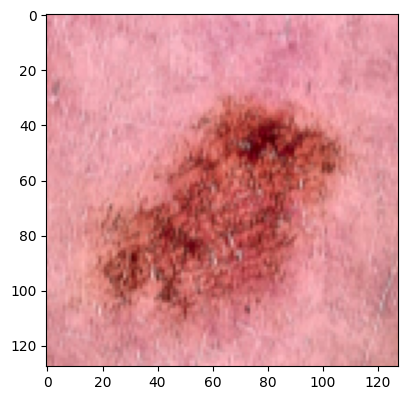

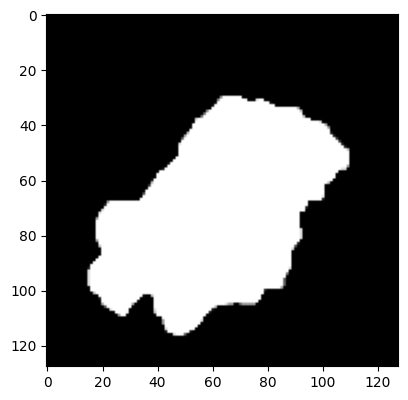

In [70]:
i=5
plt.rcParams['figure.figsize'] = [10, 5]
plt.figure(1)
plt.subplot(1,2,1)
RGBimshow(image[i])
plt.figure(2)
plt.subplot(1,2,1)
plt.rcParams['figure.figsize'] = [10, 5]
plt.imshow(binary_mask[i])

# Model

In [71]:

def repeat_elem(tensor, rep):
    # lambda function to repeat Repeats the elements of a tensor along an axis by a factor of rep.
    # If tensor has shape (None, 256,256,3), lambda will return a tensor of shape (None, 256,256,6), if specified axis=3 and rep=2.

     return layers.Lambda(lambda x, repnum: K.repeat_elements(x, repnum, axis=3),
                          arguments={'repnum': rep})(tensor)



In [72]:
def res_conv_block(x, filter_size, size, dropout, batch_norm=False):

    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(x)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation('relu')(conv)

    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(conv)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
        #conv = layers.Activation('relu')(conv)    #Activation before addition with shortcut
    if dropout > 0:
        conv = layers.Dropout(dropout)(conv)

    shortcut = layers.Conv2D(size, kernel_size=(1, 1), padding='same')(x)
    if batch_norm is True:
        shortcut = layers.BatchNormalization(axis=3)(shortcut)

    res_path = layers.add([shortcut, conv])
    res_path = layers.Activation('relu')(res_path)    #Activation after addition with shortcut (Original residual block)
    return res_path


In [73]:
def gating_signal(input, out_size, batch_norm=False):
    x = layers.Conv2D(out_size, (1, 1), padding='same')(input)
    if batch_norm:
        x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

In [74]:
def attention_block(x, gating, inter_shape):
    shape_x = K.int_shape(x)
    shape_g = K.int_shape(gating)

    theta_x = layers.Conv2D(inter_shape, (2, 2), strides=(2, 2), padding='same')(x)  # 16
    shape_theta_x = K.int_shape(theta_x)

    phi_g = layers.Conv2D(inter_shape, (1, 1), padding='same')(gating)
    upsample_g = layers.Conv2DTranspose(inter_shape, (3, 3), strides=(shape_theta_x[1] // shape_g[1], shape_theta_x[2] // shape_g[2]), padding='same')(phi_g)  # 16

    concat_xg = layers.add([upsample_g, theta_x])
    act_xg = layers.Activation('relu')(concat_xg)
    psi = layers.Conv2D(1, (1, 1), padding='same')(act_xg)
    sigmoid_xg = layers.Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)
    upsample_psi = layers.UpSampling2D(size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg)  # 32

    upsample_psi = repeat_elem(upsample_psi, shape_x[3])

    y = layers.multiply([upsample_psi, x])

    result = layers.Conv2D(shape_x[3], (1, 1), padding='same')(y)
    result_bn = layers.BatchNormalization()(result)
    return result_bn

In [75]:
def encoder_block(inputs, filter_size, filter_num, dropout_rate, batch_norm):
    conv = res_conv_block(inputs, filter_size, filter_num, dropout_rate, batch_norm)
    pool = layers.MaxPooling2D(pool_size=(2,2))(conv)
    return conv, pool

In [76]:
def decoder_block(input, conv, filter_size, filter_num, dropout_rate, batch_norm, up_samp_size, axis):
    gating = gating_signal(input, filter_num, batch_norm)
    att = attention_block(conv, gating, filter_num)
    up = layers.UpSampling2D(size=(up_samp_size, up_samp_size), data_format="channels_last")(input)
    up = layers.concatenate([up, att], axis=axis)
    up_conv = res_conv_block(up, filter_size, filter_num, dropout_rate, batch_norm)
    return up_conv

In [78]:
def Attention_Res_UNet(input_shape, NUM_CLASSES=1, dropout_rate=0.0, batch_norm=True):

    # network structure
    FILTER_NUM = 64 # number of basic filters for the first layer
    FILTER_SIZE = 3 # size of the convolutional filter
    UP_SAMP_SIZE = 2 # size of upsampling filters
    # input data
    # dimension of the image depth
    inputs = layers.Input(input_shape, dtype=tf.float32)
    axis = 3

    # Downsampling layers (Encoder Block)
    conv_128, pool_64 = encoder_block(inputs, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)
    conv_64, pool_32 = encoder_block(pool_64, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    conv_32, pool_16 = encoder_block(pool_32, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    conv_16, pool_8 = encoder_block(pool_16, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)

    conv_8 = res_conv_block(pool_8, FILTER_SIZE, 16*FILTER_NUM, dropout_rate, batch_norm)

    # Upsampling layers (Decoder Block)
    up_conv_16 = decoder_block(conv_8, conv_16, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm, UP_SAMP_SIZE, axis)
    up_conv_32 = decoder_block(up_conv_16, conv_32, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm, UP_SAMP_SIZE, axis)
    up_conv_64 = decoder_block(up_conv_32, conv_64, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm, UP_SAMP_SIZE, axis)
    up_conv_128 = decoder_block(up_conv_64, conv_128, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm, UP_SAMP_SIZE, axis)

    # 1*1 convolutional layers
    conv_final = layers.Conv2D(NUM_CLASSES, kernel_size=(1,1))(up_conv_128)
    conv_final = layers.BatchNormalization(axis=axis)(conv_final)
    conv_final = layers.Activation('sigmoid')(conv_final)  # Change to softmax for multichannel

    # Model integration
    model = models.Model(inputs, conv_final, name="AttentionResUNet")
    return model

In [79]:
input_shape = (128,128,3)
model = Attention_Res_UNet(input_shape)
model.summary()

Model: "AttentionResUNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_96 (Conv2D)  │ (None, 128, 128,  │      1,792 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_96[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_62       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_98 (Conv2D)  │ (None, 128, 128,  │        256 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_97 (Conv2D)  │ (None, 128, 128,  │     36,928 │ activation_62[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_98[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_97[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_26 (Add)        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_63       │ (None, 128, 128,  │          0 │ add_26[0][0]      │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 64, 64,    │          0 │ activation_63[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_99 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_99[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_64       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_101 (Conv2D) │ (None, 64, 64,    │      8,320 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_100 (Conv2D) │ (None, 64, 64,    │    147,584 │ activation_64[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_101[0][0]

 Total params: 39,090,377 (149.12 MB)

 Trainable params: 39,068,871 (149.04 MB)

 Non-trainable params: 21,506 (84.01 KB)

In [80]:
s=max([image.shape[0]])
img=[]
mask=[]
y = []
for i in range(s):
  try:
    img.append(image[i])
    mask.append(binary_mask[i][:, :, 0:1])
    y.append([0, 1, 0])
  except:
    pass
img = np.array(img)
mask = np.array(mask)
mask = mask.astype(bool)
y = np.array(y)

In [81]:
mask.shape

(40, 128, 128, 1)

In [82]:
from tensorflow import keras

In [83]:
call= tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy', patience =5, restore_best_weights= True)

In [84]:
arr=[]
class CustomCallback(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    arr.append(self.predict(img[1:2].reshape(128,128)))

In [85]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.01),loss='binary_crossentropy', metrics=['accuracy'])

In [45]:
history=model.fit(x=img, y=mask, epochs = 50)

Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 61s 7s/step - accuracy: 0.5359 - loss: 0.7475
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 43s 10s/step - accuracy: 0.8869 - loss: 0.5049
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 47s 9s/step - accuracy: 0.9082 - loss: 0.4580
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 76s 15s/step - accuracy: 0.9128 - loss: 0.4596
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 61s 13s/step - accuracy: 0.9167 - loss: 0.4299
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 89s 11s/step - accuracy: 0.9175 - loss: 0.4271
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 87s 35s/step - accuracy: 0.9242 - loss: 0.4096
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 85s 10s/step - accuracy: 0.9271 - loss: 0.4105
Epoch 9/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 77s 11s/step - accuracy: 0.9231 - loss: 0.3928
Epoch 10/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 81s 17s/step - accuracy: 0.9250 - loss: 0.3876
Epoch 11/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 76s 16s/step - accuracy: 0.9258 - loss: 0.3701
Epoch 12/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 71s 16s/step - accuracy: 0.9335 - loss: 0.3629
Epo

In [86]:
import pickle

with open('history.pkl', 'wb') as file:
    pickle.dump(history.history, file)


NameError: name 'history' is not defined

In [47]:
with open('history.pkl', 'rb') as file:
    saved_history = pickle.load(file)


In [48]:
import json

with open('history.json', 'w') as file:
    json.dump(history.history, file)


In [49]:
with open('history.json', 'r') as file:
    saved_history = json.load(file)


# Area Calculation

In [87]:
def maskArea(img):
  DPI = 72
  INCH_TO_CM = 2.54
  sum_of_pixels = (img.sum() / 255)
  img_area = ((1 / DPI) ** 2) * (INCH_TO_CM ** 2) * sum_of_pixels
  return img_area
def area(img):
  DPI = 72
  INCH_TO_CM = 2.54
  sum_of_pixels = img.sum()
  img_area = ((1 / DPI) ** 2) * (INCH_TO_CM ** 2) * sum_of_pixels
  return img_area

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


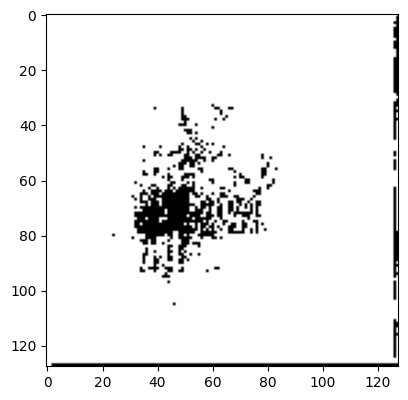

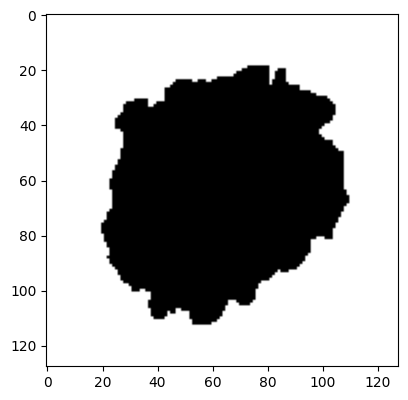

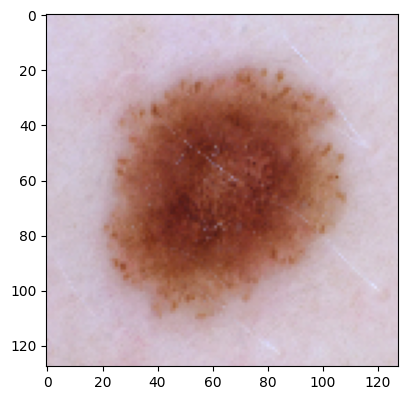

In [88]:
import matplotlib.pyplot as plt
import numpy as np

i = 10
img_test_1 = model.predict(img[i:i+1]).reshape(128, 128)

# Invert the binary prediction
img_test_1 = np.where(img_test_1 < 0.5, 1, 0)

plt.figure(1)
plt.subplot(122)
plt.imshow(img_test_1, cmap=plt.cm.binary)

plt.figure(2)
plt.subplot(122)
plt.imshow(mask[i].reshape(128, 128), cmap=plt.cm.binary)

plt.figure(3)
plt.subplot(122)
RGBimshow(img[i])

plt.show()



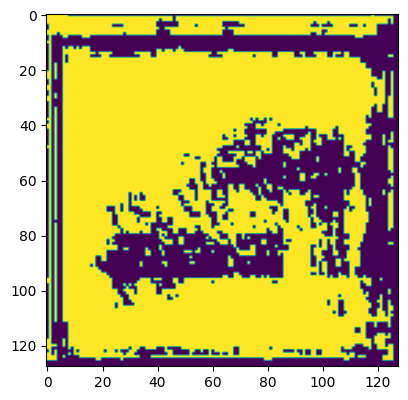

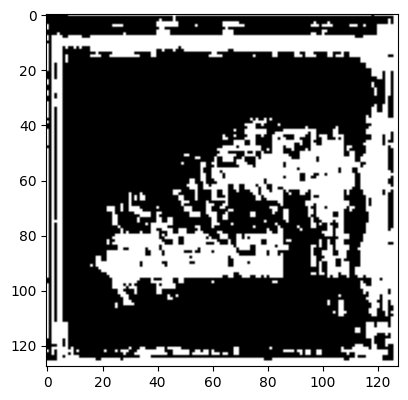

In [34]:
img_test_2 = (img_test_1 >= 0.5)
plt.figure(1)
plt.subplot(1,2,1)
plt.imshow(img_test_2)
plt.figure(2)
plt.subplot(1,2,1)
plt.imshow(img_test_2, cmap=plt.cm.binary)